**ขั้นตอนการใช้งาน classifier เบื้องต้น**

**เรียกใช้ library**
* [matplotlib](https://matplotlib.org)
* [seaborn](https://seaborn.pydata.org/)
* [pandas](https://pandas.org)
* [scikit-learn](https://scikit-learn.org)



Import libary

In [2]:
%pip install seaborn==0.13.0

Note: you may need to restart the kernel to use updated packages.


In [3]:
import warnings
warnings.simplefilter(action='ignore')

In [4]:
# Python version
import sys
import seaborn as sns
import pandas
import sklearn

print('Python: {}'.format(sys.version))
print('seaborn: {}'.format(sns.__version__))
print('pandas: {}'.format(pandas.__version__))
print('sklearn: {}'.format(sklearn.__version__))


Python: 3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]
seaborn: 0.13.0
pandas: 2.1.1
sklearn: 1.2.2


**โหลดข้อมูล [iris](https://archive.ics.uci.edu/dataset/53/iris) จาก UCI dataset**

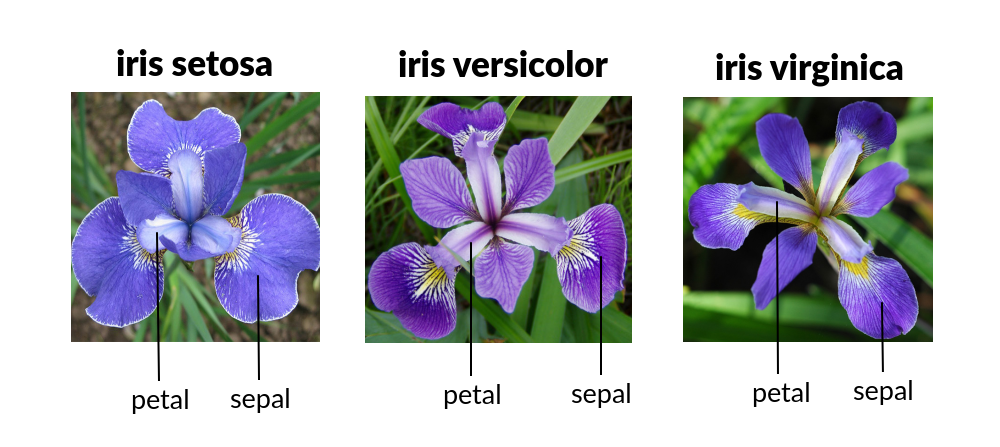





In [5]:
# Load dataset
from pandas import read_csv
# https://archive.ics.uci.edu/static/public/17/data.csv
# https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data
url = "https://archive.ics.uci.edu/static/public/17/data.csv"
names = ['ID',
         'radius1','texture1','perimeter1','area1','smoothness1','compactness1','concavity1','concave_points1','symmetry1','fractal_dimension1',
         'radius2','texture2','perimeter2','area2','smoothness2','compactness2','concavity2','concave_points2','symmetry2','fractal_dimension2',
         'radius3','texture3','perimeter3','area3','smoothness3','compactness3','concavity3','concave_points3','symmetry3','fractal_dimension3'
         ,'Diagnosis']
# names = ['sepal-length', 'sepal-width', 'petal-length', 'petal-width', 'class']
dataset = read_csv(url, names=names)

แสดงขนาดของข้อมูล


In [6]:
print(dataset.shape)

(570, 32)


In [7]:
dataset = dataset[1:] #บรรทัดแรกเป็น header เลยต้องนำออก มี data 569 ชุด

แสดงตัวอย่างข้อมูล 10 บรรทัดแรก

In [8]:
dataset.head(10)

,ID,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
1,842302,17.99,10.38,122.8,1001,0.1184,0.2776,0.3001,0.1471,0.2419,...,17.33,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189,M
2,842517,20.57,17.77,132.9,1326,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.8,1956,0.1238,0.1866,0.2416,0.186,0.275,0.08902,M
3,84300903,19.69,21.25,130,1203,0.1096,0.1599,0.1974,0.1279,0.2069,...,25.53,152.5,1709,0.1444,0.4245,0.4504,0.243,0.3613,0.08758,M
4,84348301,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,...,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173,M
5,84358402,20.29,14.34,135.1,1297,0.1003,0.1328,0.198,0.1043,0.1809,...,16.67,152.2,1575,0.1374,0.205,0.4,0.1625,0.2364,0.07678,M
6,843786,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,...,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244,M
7,844359,18.25,19.98,119.6,1040,0.09463,0.109,0.1127,0.074,0.1794,...,27.66,153.2,1606,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,M
8,84458202,13.71,20.83,90.2,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,...,28.14,110.6,897,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151,M
9,844981,13,21.82,87.5,519.8,0.1273,0.1932,0.1859,0.09353,0.235,...,30.73,106.2,739.3,0.1703,0.5401,0.539,0.206,0.4378,0.1072,M
10,84501001,12.46,24.04,83.97,475.9,0.1186,0.2396,0.2273,0.08543,0.203,...,40.68,97.65,711.4,0.1853,1.058,1.105,0.221,0.4366,0.2075,M


แสดงขนาดของข้อมูลหลังแก้

In [9]:
print(dataset.shape)

(569, 32)


แสดงสถิติพื้นฐานของชุดข้อมูล

In [10]:
# descriptions
print(dataset.describe())

            ID radius1 texture1 perimeter1  area1 smoothness1 compactness1  \
count      569     569      569        569    569         569          569   
unique     569     456      479        522    539         474          537   
top     842302   12.34    20.52      82.61  512.2      0.1007       0.1147   
freq         1       4        3          3      3           5            3   

       concavity1 concave_points1 symmetry1  ... texture3 perimeter3  area3  \
count         569             569       569  ...      569        569    569   
unique        537             542       432  ...      511        514    544   
top             0               0    0.1714  ...    27.26      117.7  472.4   
freq           13              13         4  ...        3          3      2   

       smoothness3 compactness3 concavity3 concave_points3 symmetry3  \
count          569          569        569             569       569   
unique         411          529        539             492       500 

แสดงการกระจาย ('Diagnosis') ของข้อมูล

In [11]:
# class distribution
print(dataset.groupby('Diagnosis').size())

Diagnosis
B    357
M    212
dtype: int64


แสดงการกระจายของ feature ด้วย box&whisker plot

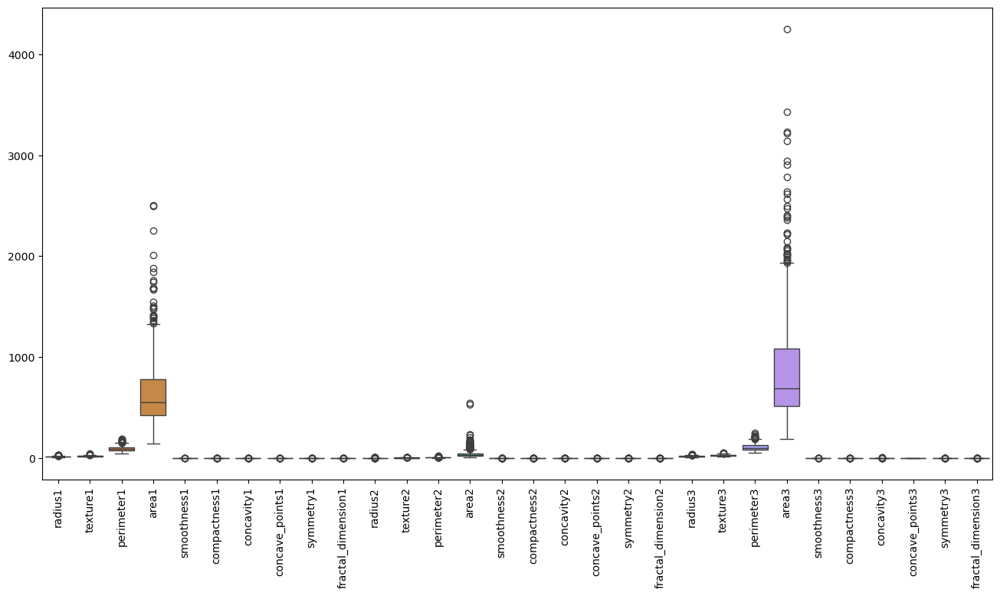

In [12]:
import seaborn as sns
from matplotlib import pyplot
import pandas as pd
numeric_columns = dataset.drop(['ID', 'Diagnosis'], axis=1)
numeric_columns = numeric_columns.apply(pd.to_numeric, errors='coerce')
pyplot.figure(figsize=(16, 8))
sns.boxplot(data=numeric_columns)
pyplot.xticks(rotation=90)
pyplot.show()


การกระจายในรูป histogram ของแต่ละ feature

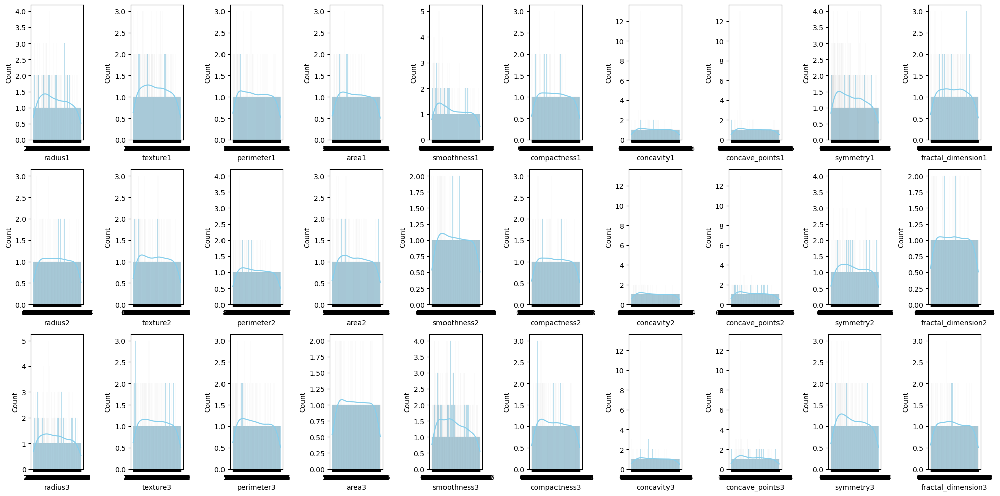

In [13]:
from matplotlib import pyplot
fig, axs = pyplot.subplots(3, 10, figsize=(20, 10))
columns = [
    'radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1',
    'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2',
    'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3'
]

axs = axs.flatten()

for i, column in enumerate(columns):
    sns.histplot(data=dataset, x=column, kde=True, color="skyblue", ax=axs[i])

pyplot.tight_layout()
pyplot.show()

ความสัมพันธ์ระหว่าง คู่ของ feature

In [14]:
import pandas as pd
numeric_columns = dataset.columns[1:-1] 
dataset[numeric_columns] = dataset[numeric_columns].apply(pd.to_numeric, errors='coerce')
sns.set(style="ticks")
sns.pairplot(dataset, hue='Diagnosis', markers=["o", "s"], palette={"B": "blue", "M": "red"})

แยกข้อมูลเป็นสองชุดคือ ชุด train และ test ด้วยสัดส่วน (70:30) (test_size=0.3) จากนั้น แยกข้อมูล train เป็น train กับ validation ด้วยสัดส่วน (75:25) (test_size=0.25)

In [31]:
from sklearn.model_selection import train_test_split# Split-out validation dataset
array = dataset.values
X = array[:,1:31]
y = array[:,31]



X_train1, X_test, y_train1, y_test = train_test_split(X, y, test_size=0.30, random_state=41)
X_train, X_val, y_train, y_val = train_test_split(X_train1, y_train1, test_size=0.25, random_state=41)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(298, 30)
(100, 30)
(171, 30)
(298,)
(100,)
(171,)


ทดสอบ learning machine 6 ตัว ได้แก่ Logistic Regression, Linear Discriminant Analysis, K Nearest Neighbor, Decision Tree, Gaussian Naive Bay และ Support Vector Machine

โดยการทดสอบ จะทำซ้ำ 10 ครั้ง และแสดงผลลัพธ์จากการเฉลี่ยของการทำซ้ำทั้งหมด

In [32]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

models = []
models.append(('RF', RandomForestClassifier()))
models.append(('SVM', SVC(gamma='auto')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('NN', MLPClassifier(hidden_layer_sizes=4)))
models.append(('LR', LogisticRegression(solver='liblinear', multi_class='ovr')))
models.append(('NB', GaussianNB()))


results เป็นสถิติของผลการรันที่สับเปลี่ยนกลุ่มตัวอย่าง 10 รอบ

In [33]:
# Spot Check Algorithms

# evaluate each model in turn
results = []
names = []
best_model_name = ''
max_mean = -1
min_sd = 100000000
for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    mean = cv_results.mean()
    sd = cv_results.std()
    print('%s: %f (%f)' % (name, mean, sd))

    if mean > max_mean:
        max_mean = mean
        min_sd = sd
        best_model_name = name
        best_model = model
    elif mean == max_mean:
        if sd < min_sd:
            min_sd = sd
            best_model_name = name
            best_model = model
print("best model = %s (accuracy = %s, sd = %s)"%(best_model_name, max_mean, min_sd))

RF: 0.953103 (0.042618)
SVM: 0.600690 (0.007833)
LDA: 0.939540 (0.039162)
CART: 0.909655 (0.066576)
KNN: 0.926552 (0.064565)
NN: 0.643448 (0.191660)
LR: 0.939770 (0.049026)
NB: 0.929770 (0.050432)
best model = RF (accuracy = 0.953103448275862, sd = 0.04261811049989877)


เปรียบเทียบ Learning Machine ด้วย box plot

[Text(0, 0, 'RF'),
 Text(1, 0, 'SVM'),
 Text(2, 0, 'LDA'),
 Text(3, 0, 'CART'),
 Text(4, 0, 'KNN'),
 Text(5, 0, 'NN'),
 Text(6, 0, 'LR'),
 Text(7, 0, 'NB')]

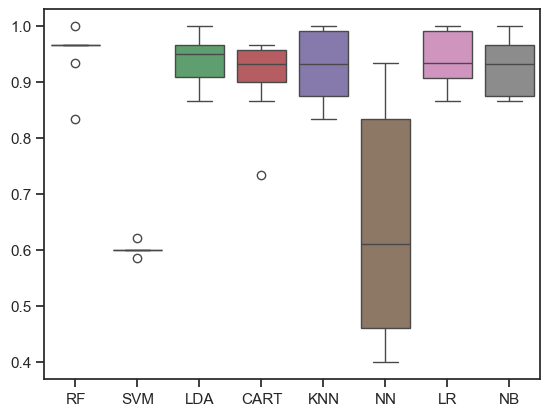

In [34]:
ax = sns.boxplot(results)
ax.set_xticklabels(names)


**สอน best model ให้มีความรู้ ด้วยชุดข้อมูล train1**

In [35]:
print("Selected Model : %s"%(best_model_name))
model = best_model
model.fit(X_train1, y_train1)

Selected Model : RF


RandomForestClassifier()

**ทดสอบการพยากรณ์**

In [36]:
predictions = model.predict(X_test)

print(predictions)

['B' 'B' 'B' 'B' 'B' 'B' 'M' 'M' 'M' 'B' 'M' 'M' 'M' 'B' 'B' 'B' 'B' 'B'
 'B' 'B' 'M' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'M' 'B' 'B' 'B' 'B' 'B'
 'M' 'B' 'M' 'B' 'B' 'M' 'B' 'M' 'B' 'B' 'B' 'B' 'B' 'M' 'B' 'B' 'M' 'M'
 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'M' 'M' 'M' 'B' 'M' 'M' 'M' 'B' 'M' 'M'
 'B' 'B' 'M' 'B' 'M' 'M' 'B' 'B' 'B' 'M' 'B' 'M' 'M' 'B' 'M' 'B' 'M' 'B'
 'M' 'B' 'B' 'M' 'M' 'M' 'M' 'B' 'M' 'B' 'M' 'M' 'M' 'B' 'B' 'M' 'B' 'B'
 'M' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'M' 'B' 'M' 'B' 'B' 'M' 'B' 'B'
 'B' 'B' 'M' 'B' 'M' 'M' 'B' 'B' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'B' 'B' 'M'
 'B' 'B' 'B' 'M' 'B' 'B' 'M' 'M' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'B' 'M' 'B'
 'B' 'B' 'B' 'M' 'M' 'B' 'M' 'B' 'B']


**ผลการพยากรณ์ แสดงในรูปของ accuracy และ confusion matrix**

In [37]:
from sklearn.metrics import accuracy_score
print("accuracy = %s"%(accuracy_score(y_test, predictions)))

accuracy = 0.9883040935672515


[[108   2]
 [  0  61]]


<Axes: >

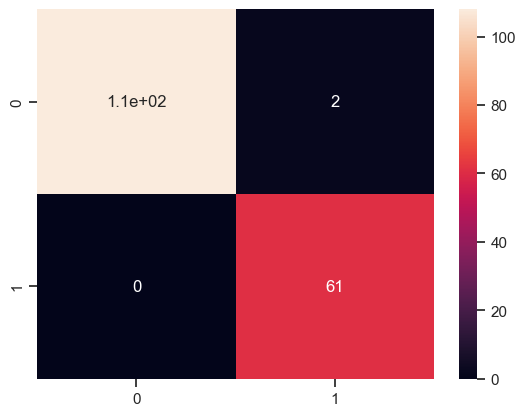

In [38]:
from sklearn.metrics import confusion_matrix
cfm=confusion_matrix(y_test, predictions)
print(cfm)
sns.heatmap(cfm,annot=True)

In [39]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           B       1.00      0.98      0.99       110
           M       0.97      1.00      0.98        61

    accuracy                           0.99       171
   macro avg       0.98      0.99      0.99       171
weighted avg       0.99      0.99      0.99       171

